<a href="https://colab.research.google.com/github/DSwing/CycleGAN/blob/main/Cycle_gan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Cycle GAN

**Date created:** 2024/09/30<br>
**Description:** Training a cycleGAN to generate Monet style images.

In this notebook, we tackle the "I’m Something of a Painter Myself" Kaggle competition, which involves transforming images into an artistic style using unpaired data. The goal is to generate paintings in the style of the famous French Impressionist artist Claude Monet by transforming real-world photos without having paired photo-painting data.

This competition is a classic example of unpaired image-to-image translation, where we have two domains: real photos and Monet-style paintings, but no direct one-to-one mapping between them. To address this, we will implement a CycleGAN (Cycle-Consistent Generative Adversarial Network), a model specifically designed for translating images between two domains without paired examples.

## CycleGAN model
The CycleGAN model introduces two generators and two discriminators. One generator will learn to convert real photos into Monet-style paintings, while the other will learn the reverse mapping. What makes CycleGAN unique is its cycle-consistency loss, which ensures that converting a photo to a painting and back again should return the original photo. This helps preserve key features of the input images during transformation, even in the absence of paired training data.

To further enhance the quality of the generated images, we will incorporate a ResNet-based generator. The use of residual blocks allows the generator to learn more complex transformations without losing important image information, making it a powerful architecture for artistic style transfer.

## Objectives
* Train a CycleGAN model to perform unpaired image-to-image translation, transforming real photos into Monet-style paintings.
* Use a ResNet-based generator to effectively capture Monet's painting style while preserving essential content from the original photos.
* Visualize and evaluate the model’s performance by comparing the generated images to actual Monet paintings.

## Imports

In [1]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 65 bytes


In [2]:

import os
from IPython import display
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np
import imageio

import tensorflow as tf
import tensorflow.keras.layers as layers
import tensorflow.keras.optimizers as optimizers
from tensorflow.keras.utils import plot_model


## Prepare the Dataset

In [3]:
!kaggle competitions download -c gan-getting-started

100% 366M/367M [00:22<00:00, 16.8MB/s]
100% 367M/367M [00:22<00:00, 17.2MB/s]


In [4]:
!ls

gan-getting-started.zip  sample_data


In [5]:
!unzip gan-getting-started.zip

Streaming output truncated to the last 5000 lines.
  inflating: photo_jpg/46e84039a1.jpg  
  inflating: photo_jpg/46f391abec.jpg  
  inflating: photo_jpg/46f5ef1042.jpg  
  inflating: photo_jpg/4706619607.jpg  
  inflating: photo_jpg/4707b03a08.jpg  
  inflating: photo_jpg/47100a9939.jpg  
  inflating: photo_jpg/471f4755b9.jpg  
  inflating: photo_jpg/472b351bc4.jpg  
  inflating: photo_jpg/472d5ac100.jpg  
  inflating: photo_jpg/4758e5dd4c.jpg  
  inflating: photo_jpg/4762bb79ef.jpg  
  inflating: photo_jpg/4778b13518.jpg  
  inflating: photo_jpg/4787b82d37.jpg  
  inflating: photo_jpg/478e07feaa.jpg  
  inflating: photo_jpg/478eb12a82.jpg  
  inflating: photo_jpg/479698b371.jpg  
  inflating: photo_jpg/4796d67f61.jpg  
  inflating: photo_jpg/47aad493bd.jpg  
  inflating: photo_jpg/47ae0edd23.jpg  
  inflating: photo_jpg/47b94957ff.jpg  
  inflating: photo_jpg/47bb43fe3e.jpg  
  inflating: photo_jpg/47bb59d449.jpg  
  inflating: photo_jpg/47d391d94b.jpg  
  inflating: photo_jpg/47df26

The data are organized in the following folders:
* monet_jpg:
This folder contains the Monet-style paintings in JPEG format.
* monet_tfrec:
This folder holds the same Monet paintings but in the TFRecord format. TFRecords are a TensorFlow-specific binary storage format that optimizes the reading speed when loading large datasets.
* photo_jpg:
This folder contains real-world photos in JPEG format, which represent the source domain.
* photo_tfrec:
Similar to the Monet TFRecords, this folder contains the real-world photos in TFRecord format. Again, using these files instead of the raw JPEG images can speed up the data loading process during training.

We will use the TFRecord format for both the Monet paintings and the real-world photos. TFRecords offer several advantages:
* Efficiency: TFRecords are optimized for TensorFlow pipelines, leading to faster data reading and processing, especially with large datasets.
* Scalability: As the dataset grows, TFRecords can handle large volumes of data more efficiently than raw image files.  

By leveraging the TFRecord format, we aim to speed up the data pipeline, allowing for faster iterations during training with our CycleGAN model.

In [6]:
!ls

gan-getting-started.zip  monet_jpg  monet_tfrec  photo_jpg  photo_tfrec  sample_data


In [7]:
train = []
test = []

for img in os.listdir('monet_tfrec'):
  train.append(os.path.join('monet_tfrec', img))

for img in os.listdir('photo_tfrec'):
  test.append(os.path.join('photo_tfrec', img))

train[:3], test[:3]

(['monet_tfrec/monet00-60.tfrec',
  'monet_tfrec/monet12-60.tfrec',
  'monet_tfrec/monet16-60.tfrec'],
 ['photo_tfrec/photo10-352.tfrec',
  'photo_tfrec/photo08-352.tfrec',
  'photo_tfrec/photo02-352.tfrec'])

In [8]:
train_ds_raw = tf.data.TFRecordDataset(train)
test_ds_raw = tf.data.TFRecordDataset(test)

train_ds_raw, test_ds_raw

(<TFRecordDatasetV2 element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>,
 <TFRecordDatasetV2 element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>)

Inspecting features from both the training and test TFRecord datasets. The features field contains the information that was serialized into the TFRecord format, and by printing it, we can examine the content and structure of the dataset.

In [9]:
for img in train_ds_raw.take(1):
  example = tf.train.Example()
  example.ParseFromString(img.numpy())

print(example.features.feature)

for img in test_ds_raw.take(1):
  example = tf.train.Example()
  example.ParseFromString(img.numpy())

#for key, features in example.features.feature.items():
print(example.features.feature)


{'image_name': bytes_list {
  value: "25c9904782"
}
, 'image': bytes_list {
  value: "\377\330\377\340\000\020JFIF\000\001\001\001\001,\001,\000\000\377\333\000C\000\002\001\001\001\001\001\002\001\001\001\002\002\002\002\002\004\003\002\002\002\002\005\004\004\003\004\006\005\006\006\006\005\006\006\006\007\t\010\006\007\t\007\006\006\010\013\010\t\n\n\n\n\n\006\010\013\014\013\n\014\t\n\n\n\377\333\000C\001\002\002\002\002\002\002\005\003\003\005\n\007\006\007\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\377\300\000\021\010\001\000\001\000\003\001\021\000\002\021\001\003\021\001\377\304\000\036\000\000\002\002\003\001\001\001\001\000\000\000\000\000\000\000\000\006\007\004\005\003\010\t\002\000\n\001\377\304\000K\020\000\002\001\002\004\003\005\005\004\t\003\001\007\001\t\000\003\004\005\006\023\000\002\007#\0243C\010\022\025Sc\001\"$s\203\02624\223\t\027%D\243\263\303\323\360\021B\343\363!&5ERTd\030\n1QUbrt\264\324\377\304\000\0

## Data Parsing
Converting serialized TFRecords into a structured format that can be directly used for training and evaluation in TensorFlow.

After this process, the datasets (train_ds and test_ds) will contain dictionaries where each entry has three keys:
* 'image' (the raw image data)
* 'image_name' (the name of the image)
* 'target' (the target label)

In [10]:
def parse_input(input_tfr):
  out = tf.io.parse_single_example(input_tfr, {
    'image': tf.io.FixedLenFeature([], tf.string, default_value=''),
    'image_name': tf.io.FixedLenFeature([], tf.string, default_value=''),
    'target': tf.io.FixedLenFeature([], tf.string, default_value='')
    })
  return out

train_ds = train_ds_raw.map(parse_input)
test_ds = test_ds_raw.map(parse_input)
train_ds, test_ds

(<_MapDataset element_spec={'image': TensorSpec(shape=(), dtype=tf.string, name=None), 'image_name': TensorSpec(shape=(), dtype=tf.string, name=None), 'target': TensorSpec(shape=(), dtype=tf.string, name=None)}>,
 <_MapDataset element_spec={'image': TensorSpec(shape=(), dtype=tf.string, name=None), 'image_name': TensorSpec(shape=(), dtype=tf.string, name=None), 'target': TensorSpec(shape=(), dtype=tf.string, name=None)}>)

Testing the first example from the dataset, extracting the image name, target label, and the actual image data.
The image name and target label are printed, while the image is decoded from JPEG and visualized.

tf.Tensor(b'25c9904782', shape=(), dtype=string)
monet


array([[[ 39,  57,   0],
        [ 63,  80,  25],
        [110, 127,  82],
        ...,
        [120, 139, 119],
        [109, 130, 111],
        [117, 140, 120]],

       [[ 92,  77,  18],
        [105,  96,  41],
        [132, 128,  81],
        ...,
        [126, 145, 139],
        [117, 138, 131],
        [124, 147, 139]],

       [[113,  98,  33],
        [127, 115,  55],
        [142, 135,  81],
        ...,
        [128, 151, 157],
        [120, 144, 148],
        [125, 149, 153]],

       ...,

       [[ 79,  90,  56],
        [ 68,  79,  45],
        [ 59,  70,  38],
        ...,
        [120, 137, 103],
        [117, 130,  86],
        [100, 110,  57]],

       [[ 50,  60,  23],
        [ 51,  61,  24],
        [ 55,  62,  28],
        ...,
        [135, 141,  93],
        [112, 116,  66],
        [ 96,  98,  48]],

       [[ 57,  65,  26],
        [ 51,  59,  20],
        [ 52,  58,  22],
        ...,
        [153, 147,  97],
        [124, 120,  56],
        [ 94,  95,  17]]], dtype=uint8)
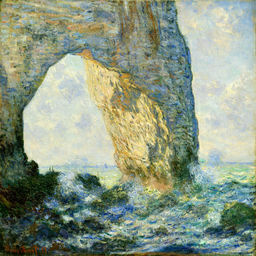

In [11]:
x = next(img for img in train_ds.take(1))
print(x['image_name'])#.numpy().decode('utf-8'))
print(x['target'].numpy().decode('utf-8'))
tf.io.decode_jpeg(x['image']).numpy()

c2d01b1977
photo


array([[[  0,  46, 141],
        [  0,  54, 155],
        [  0,  62, 170],
        ...,
        [  0,  30,  85],
        [  0,  28,  82],
        [  0,  25,  78]],

       [[  0,  50, 146],
        [  0,  58, 160],
        [  0,  66, 175],
        ...,
        [  0,  30,  87],
        [  0,  28,  82],
        [  0,  26,  79]],

       [[  0,  55, 155],
        [  0,  63, 168],
        [  0,  70, 181],
        ...,
        [  0,  32,  91],
        [  0,  30,  87],
        [  0,  27,  83]],

       ...,

       [[ 48,  10,   0],
        [ 60,  17,   8],
        [ 84,  32,   8],
        ...,
        [  7,   5,  19],
        [  0,   1,   3],
        [  0,   0,   4]],

       [[ 49,  15,   6],
        [ 53,  15,   6],
        [ 72,  27,   4],
        ...,
        [  0,   0,  14],
        [  1,   0,   0],
        [  0,   3,   5]],

       [[ 60,  28,   7],
        [ 64,  26,   7],
        [ 69,  28,   8],
        ...,
        [  0,   1,   0],
        [  3,   0,   0],
        [  0,   0,   5]]], dtype=uint8)
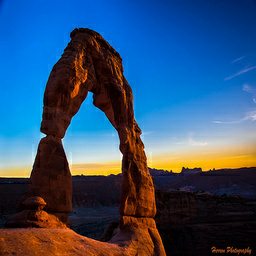

In [12]:
x = next(img for img in test_ds.take(1))
print(x['image_name'].numpy().decode('utf-8'))
print(x['target'].numpy().decode('utf-8'))
tf.io.decode_jpeg(x['image']).numpy()

## Preprocessing  
Setting up the preprocessing pipeline for training and test, crucial for preparing the data before feeding it into the CycleGAN model.

Training images are decoded into JPEG format.
Random horizontal flips is applied to add variety.
The images are resized to the 286x286 size and then randomly croped to 256x256.
Pixel values are normalized.
Test images are only resized to 256x256 and normalized, ensuring consistency during evaluation.

train_ds and test_ds are transformed by mapping the preprocessing functions, and then cached, shuffled (for training), and batched:  
cache() stores the dataset in memory after the first epoch to speed up subsequent epochs.  
shuffle(buffer_size) randomizes the order of the training data.  
batch(batch_size) groups the data into batches



In [13]:
# Define the standard image size.
orig_img_size = (286, 286)
# Size of the random crops to be used during training.
input_img_size = (256, 256, 3)
# Weights initializer for the layers.
kernel_init = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

buffer_size = 256
batch_size = 1
autotune = tf.data.AUTOTUNE

def normalize_img(img):
    img = tf.cast(img, dtype=tf.float32)
    # Map values in the range [-1, 1]
    return (img / 127.5) - 1.0


def preprocess_train_image(img):
    # Random flip
    img = tf.io.decode_jpeg(img['image'])
    img = tf.image.random_flip_left_right(img)
    # Resize to the original size first
    img = tf.image.resize(img, [*orig_img_size])
    # Random crop to 256X256
    img = tf.image.random_crop(img, size=[*input_img_size])
    # Normalize the pixel values in the range [-1, 1]
    img = normalize_img(img)
    return img


def preprocess_test_image(img):
    # Only resizing and normalization for the test images.
    img = tf.io.decode_jpeg(img['image'])
    img = tf.image.resize(img, [input_img_size[0], input_img_size[1]])
    img = normalize_img(img)
    return img

# Apply the preprocessing operations to the data
train_ds = (
    train_ds.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)

test_ds = (
    test_ds.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)



Shape:  (1, 256, 256, 3)


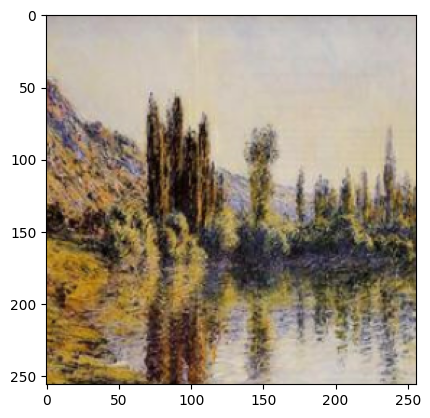

In [14]:
x = next(iter(train_ds.take(1)))
print('Shape: ', x.numpy().shape)
plt.imshow((x[0].numpy() * 127.5 + 127.5).astype(np.uint8))

Shape:  (1, 256, 256, 3)


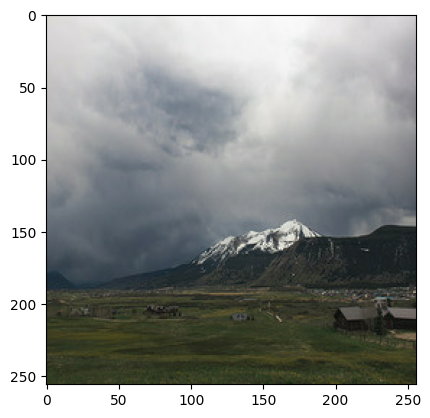

In [15]:
x = next(iter(test_ds.take(1)))
print('Shape: ', x.numpy().shape)
plt.imshow((x[0].numpy() * 127.5 + 127.5).astype(np.uint8))


## Defining building blocks  
Defining the components for generator and discriminator of the CycleGAN architecture:  
* ReflectionPadding2D Layer:  
Reflection padding pads the input by reflecting the edges of the image, which helps avoid artifacts that might arise from zero padding in convolutional layers.

* residual_block:  
This function defines a residual block, a key element in ResNet architectures. It uses two convolutional layers with reflection padding, layer normalization, and a specified activation function.
A skip connection (using layers.add) is used to add the original input to the output of the second convolutional layer, which helps preserve important features and improve gradient flow during training.  

* downsample:    
This function applies a downsampling operation using a convolutional layer. It reduces the spatial dimensions of the input while increasing the number of filters.
It also applies layer normalization and an activation function.  
* upsample:  
The upsampling operation uses a transposed convolution to increase the spatial dimensions of the input. This is often used in generator models to restore the image to its original resolution.
Like downsample, it applies layer normalization and an optional activation function.

In [16]:
class ReflectionPadding2D(layers.Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super().__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")


def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tf.keras.layers.LayerNormalization(axis=[1, 2], gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tf.keras.layers.LayerNormalization(axis=[1, 2], gamma_initializer=gamma_initializer)(x)
    x = layers.add([input_tensor, x])
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tf.keras.layers.LayerNormalization(axis=[1, 2], gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tf.keras.layers.LayerNormalization(axis=[1, 2], gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x

## Dicriminator and Generator  
The discriminator model in this CycleGAN setup is responsible for distinguishing between real and generated images. It starts with an input layer and applies a convolutional layer that processes the input image with a stride of (2, 2), effectively downsampling the image while extracting features. The LeakyReLU activation function is used for better gradient flow during training, especially for the negative inputs.

The model follows with three downsampling blocks that progressively increase the number of filters and further reduce the spatial dimensions, allowing the model to focus on larger areas of the image. The downsampling layers use LeakyReLU activations to introduce non-linearity and learn more complex patterns.

Finally, the network applies a Conv2D layer with a single output channel, which produces the final classification prediction (real or fake). The output is a feature map, which is used for the adversarial loss to help the discriminator learn to differentiate between real and generated images.

The generator model is built using a ResNet-based architecture, starting with an input layer, reflection padding, and a series of convolutional layers.
It includes downsampling blocks to reduce the image dimensions and extract features, followed by several residual blocks. Residual blocks allow the network to learn transformations while preserving original image information, which is critical for image-to-image translation tasks.
After applying the residual blocks, the model upscales the image to its original dimensions through upsampling blocks, generating an image in the target domain.
The final output is passed through a convolutional layer with a "tanh" activation, ensuring the output pixel values fall between -1 and 1, matching the normalized range of the input images.

In [17]:
def get_discriminator(
    filters=32, kernel_initializer=kernel_init, num_downsampling=1, name=None
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = layers.Conv2D(
        filters,
        (3, 3),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)

    num_filters = filters
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(3, 3),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(3, 3),
                strides=(1, 1),
            )

    x = layers.Conv2D(1, (3, 3), strides=(1, 1),
                      padding="same",
                      kernel_initializer=kernel_initializer)(x)


    model = tf.keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model

def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=1,
    num_residual_blocks=3,
    num_upsample_blocks=1,
    gamma_initializer=gamma_init,
    name=None,
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(x)
    x = tf.keras.layers.LayerNormalization(axis=[1, 2], gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)

    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))

    # Upsampling
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=layers.Activation("relu"))

    # Final block
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid")(x)
    x = layers.Activation("tanh")(x)

    model = tf.keras.models.Model(img_input, x, name=name)
    return model

In [18]:
# Get the generators
monet_generator = get_resnet_generator(name="generator_G")
photo_generator = get_resnet_generator(name="generator_F")

# Get the discriminators
photo_discriminator = get_discriminator(name="discriminator_X")
monet_discriminator = get_discriminator(name="discriminator_Y")


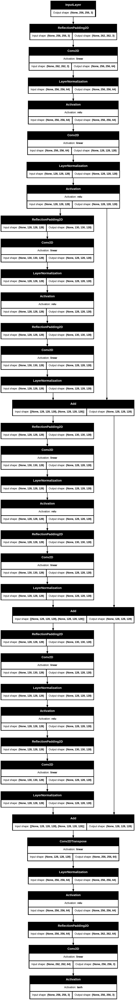

In [19]:
plot_model(monet_generator, show_shapes=True, show_layer_activations=True)

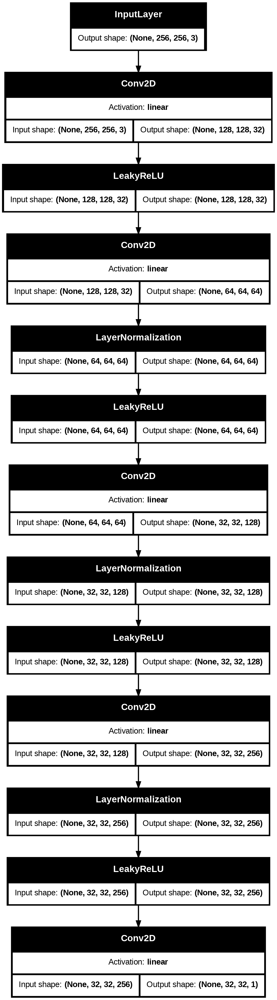

In [20]:
plot_model(monet_discriminator, show_shapes=True, show_layer_activations=True)

## CycleGAN
The CycleGan class implements the complete CycleGAN model, which consists of two generators and two discriminators. The generators (gen_G and gen_F) are responsible for translating images between two domains (from photos to Monet-style paintings and vice versa), while the discriminators (disc_X and disc_Y) aim to differentiate between real and generated images in each domain.

The model is initialized with parameters for cycle consistency and identity loss, which ensure the quality of the generated images and that they preserve the content of the original input. The compile method sets up the optimizers and loss functions for both the generators and discriminators.

During training (train_step), the model:

Translates real images from one domain to the other using the generators.
Applies cycle consistency by translating the generated images back to the original domain and comparing them with the real images.
Applies identity mapping, where images are passed through the generators without transformation to preserve original features.
The generators' adversarial losses, cycle consistency losses, and identity losses are combined to update their weights, while the discriminators are updated based on their ability to distinguish real from fake images.
The method returns a dictionary of losses to track the training progress.

In [21]:
class CycleGan(tf.keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=8.0,
        lambda_identity=0.5,
    ):
        super().__init__()
        self.gen_G = generator_G
        self.gen_F = generator_F
        self.disc_X = discriminator_X
        self.disc_Y = discriminator_Y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity

    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super().compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = tf.keras.losses.MeanAbsoluteError()
        self.identity_loss_fn = tf.keras.losses.MeanAbsoluteError()

    def train_step(self, batch_data):
        real_x, real_y = batch_data

        # For CycleGAN, we need to calculate different
        # kinds of losses for the generators and discriminators.
        # We will perform the following steps here:
        #
        # 1. Pass real images through the generators and get the generated images
        # 2. Pass the generated images back to the generators to check if we
        #    can predict the original image from the generated image.
        # 3. Do an identity mapping of the real images using the generators.
        # 4. Pass the generated images in 1) to the corresponding discriminators.
        # 5. Calculate the generators total loss (adversarial + cycle + identity)
        # 6. Calculate the discriminators loss
        # 7. Update the weights of the generators
        # 8. Update the weights of the discriminators
        # 9. Return the losses in a dictionary

        with tf.GradientTape(persistent=True) as tape:
            # real_photo to fake_monet
            fake_y = self.gen_G(real_x, training=True)
            # real_monet to fake_photo-> y2x
            fake_x = self.gen_F(real_y, training=True)

            # Cycle (real_photo to fake_monet to fake_photo): x -> y -> x
            cycled_x = self.gen_F(fake_y, training=True)
            # Cycle (real_monet to fake_photo to fake_monet) y -> x -> y
            cycled_y = self.gen_G(fake_x, training=True)

            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adversarial loss
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }

## Monitoring
The GANMonitor class is a custom callback designed to generate and save images at the end of each training epoch. This allows us to visually track the progress of the CycleGAN model during training by comparing the input images with their corresponding generated outputs.

At the end of every epoch, the callback:

Takes a batch of images from the test dataset (test_ds) and uses the generator (gen_G) to translate them into the target domain.
Displays both the input and translated images side by side for visual comparison, scaling the pixel values back to their original range for better viewing.
Saves the generated images as PNG files for each epoch, allowing you to observe how the model improves over time.

In [22]:
class GANMonitor(tf.keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        for i, img in enumerate(test_ds.take(self.num_img)):
            prediction = self.model.gen_G(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

            prediction = tf.keras.utils.array_to_img(prediction)
            prediction.save(
                "generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            )
        plt.show()
        plt.close()

## Training
Adversarial Loss Function:  
The adv_loss_fn uses tf.keras.losses.MeanSquaredError to measure how well the generator fools the discriminator and how accurate the discriminator is in distinguishing between real and fake images.

Generator Loss:

generator_loss_fn takes in the discriminator's prediction for fake images and compares it to a matrix of ones.

Discriminator Loss:

discriminator_loss_fn evaluates both real and fake images by comparing real images to a matrix of ones and fake images to a matrix of zeros, encouraging the discriminator to classify them correctly.

CycleGAN Model Creation and Compilation:

The CycleGAN is built with the defined generators and discriminators and is compiled using Adam optimizers with a learning rate of 2e-4 and beta value of 0.5 for stability during training.

Callbacks:

GANMonitor: Displays and saves the generated images at the end of each epoch.  
ModelCheckpoint: Saves the model's weights after every epoch.
Training: The model is trained for 10 epochs using a zipped dataset that combines both the training and test datasets, with the defined callbacks tracking its progress.

Epoch 1/10
    300/Unknown 105s 88ms/step - D_X_loss: 0.2034 - D_Y_loss: 0.1110 - F_loss: 4.2509 - G_loss: 5.3097

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


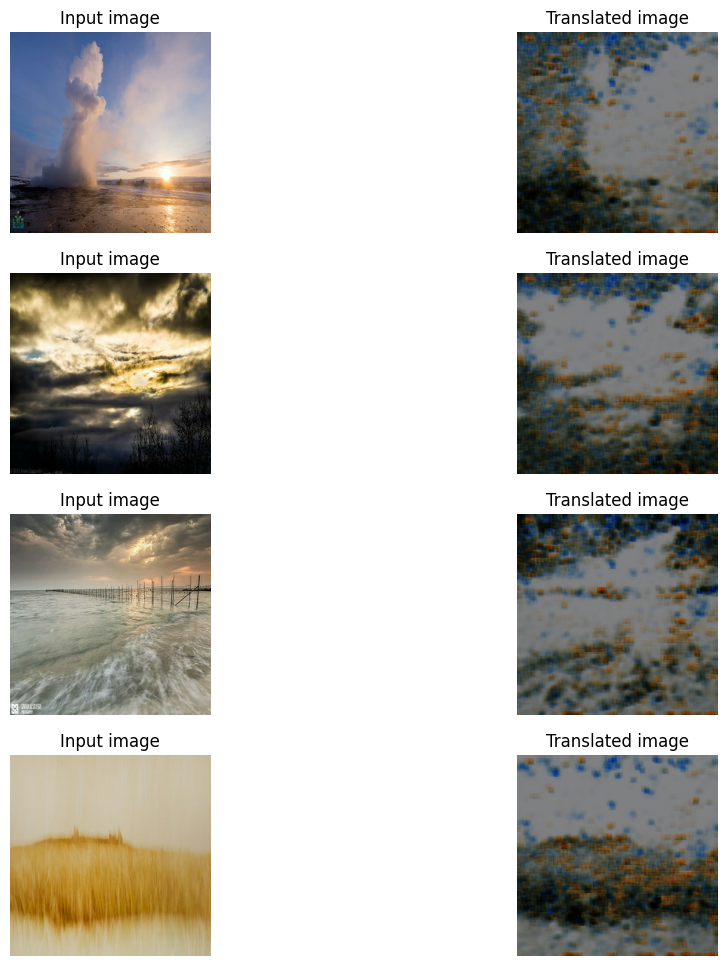

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_api.py:102: UserWarning: You are saving a model that has not yet been built. It might not contain any weights yet. Consider building the model first by calling it on some data.
  return saving_lib.save_model(model, filepath)


300/300 ━━━━━━━━━━━━━━━━━━━━ 107s 97ms/step - D_X_loss: 0.2032 - D_Y_loss: 0.1108 - F_loss: 4.2496 - G_loss: 5.3060
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - D_X_loss: 0.1942 - D_Y_loss: 0.0725 - F_loss: 3.8361 - G_loss: 4.9856

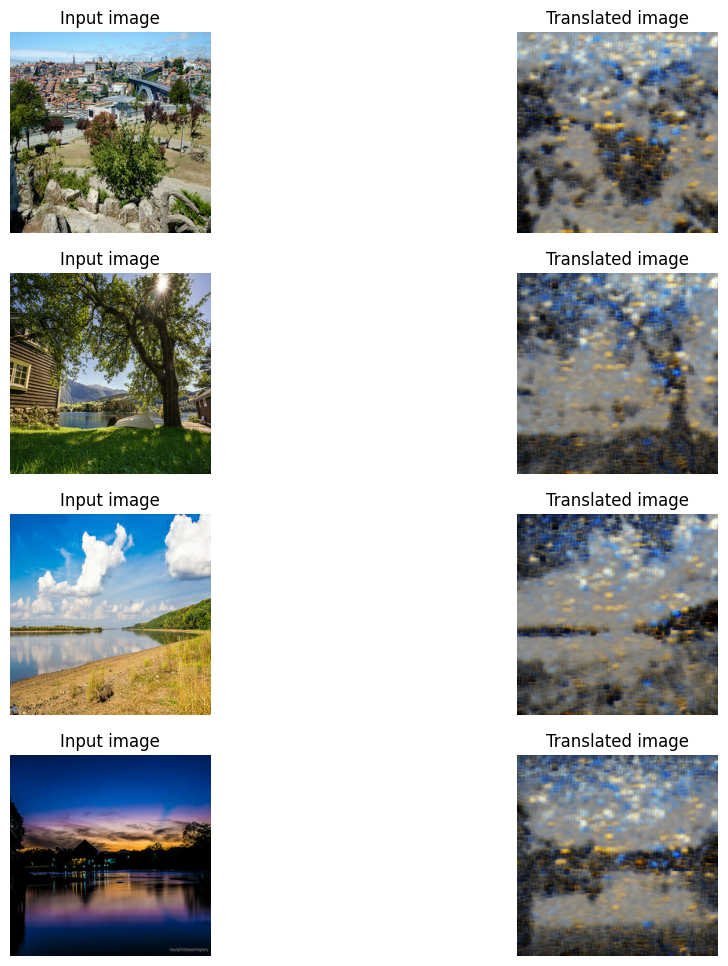

300/300 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - D_X_loss: 0.1943 - D_Y_loss: 0.0724 - F_loss: 3.8339 - G_loss: 4.9820
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - D_X_loss: 0.1885 - D_Y_loss: 0.1801 - F_loss: 3.6851 - G_loss: 4.2184

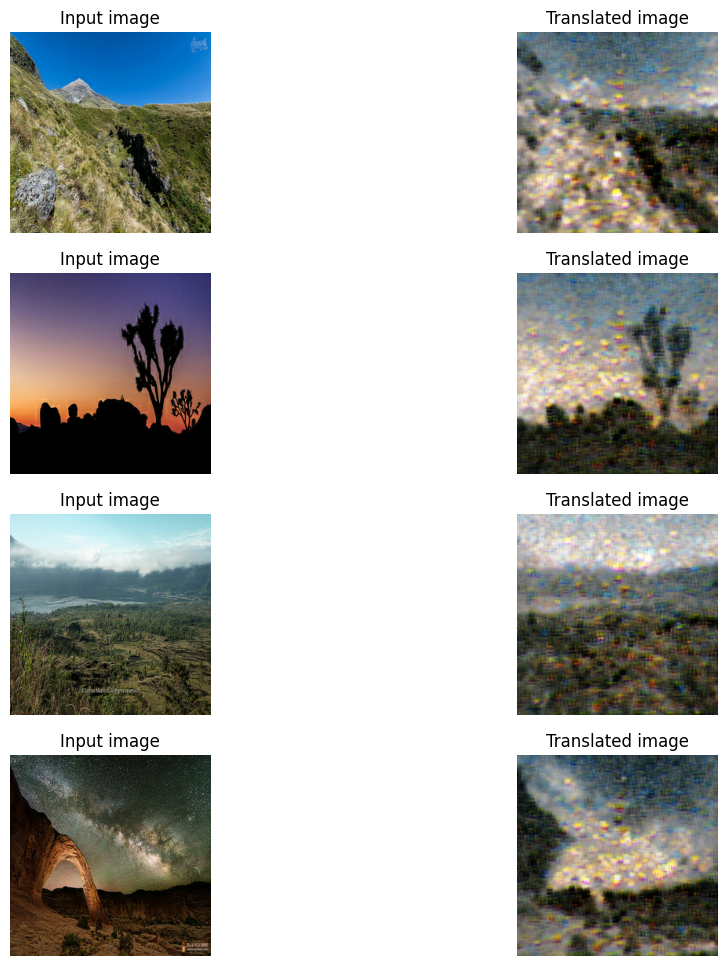

300/300 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - D_X_loss: 0.1883 - D_Y_loss: 0.1804 - F_loss: 3.6855 - G_loss: 4.2137
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - D_X_loss: 0.1906 - D_Y_loss: 0.1677 - F_loss: 3.5328 - G_loss: 4.1586

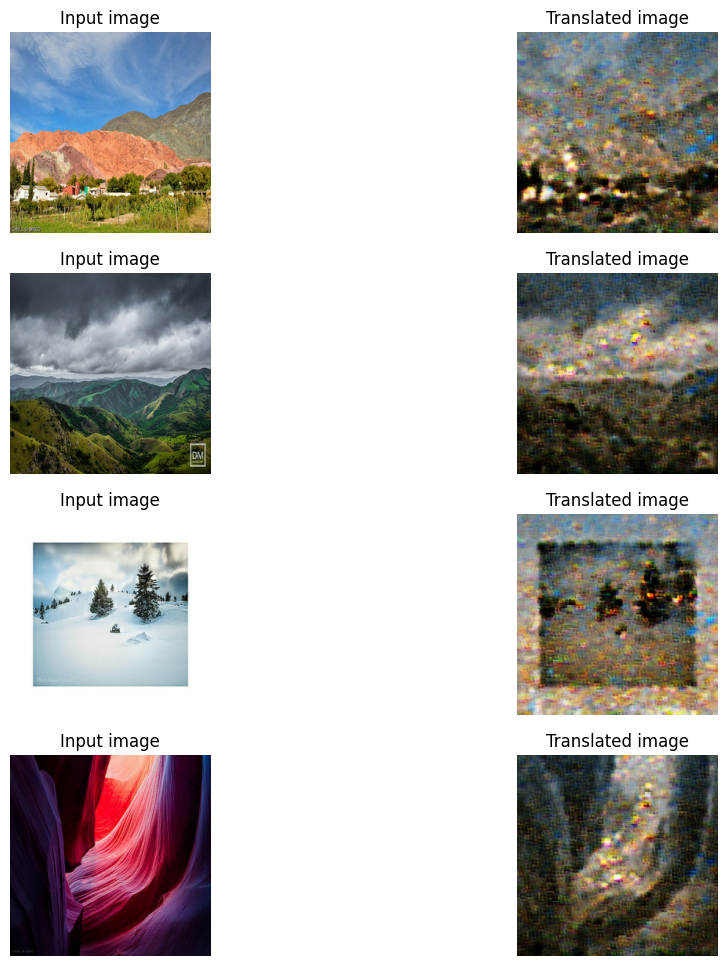

300/300 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - D_X_loss: 0.1905 - D_Y_loss: 0.1674 - F_loss: 3.5367 - G_loss: 4.1554
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - D_X_loss: 0.2035 - D_Y_loss: 0.1604 - F_loss: 3.3451 - G_loss: 4.0409

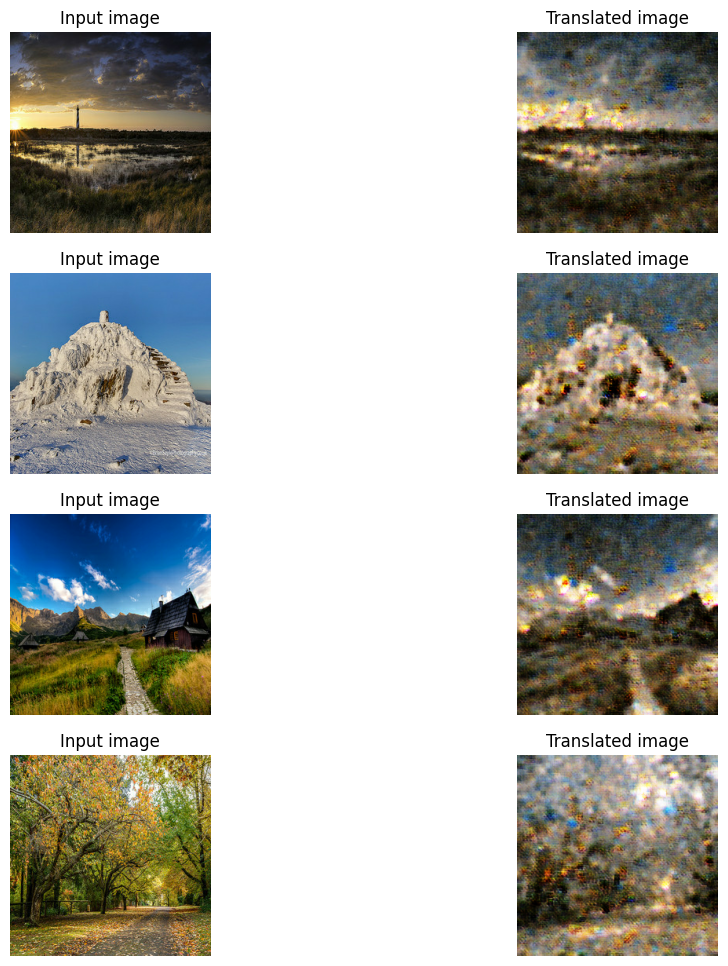

300/300 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step - D_X_loss: 0.2038 - D_Y_loss: 0.1602 - F_loss: 3.3442 - G_loss: 4.0448
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - D_X_loss: 0.2068 - D_Y_loss: 0.1711 - F_loss: 3.1010 - G_loss: 3.6802

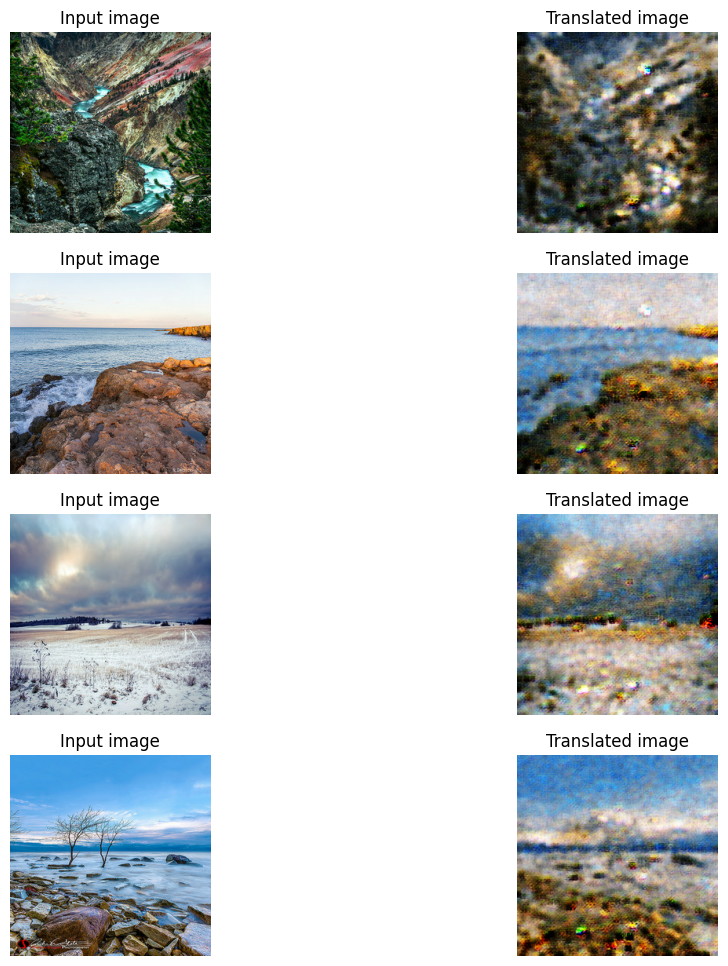

300/300 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step - D_X_loss: 0.2066 - D_Y_loss: 0.1708 - F_loss: 3.1001 - G_loss: 3.6772
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - D_X_loss: 0.1993 - D_Y_loss: 0.1632 - F_loss: 2.9706 - G_loss: 3.4912

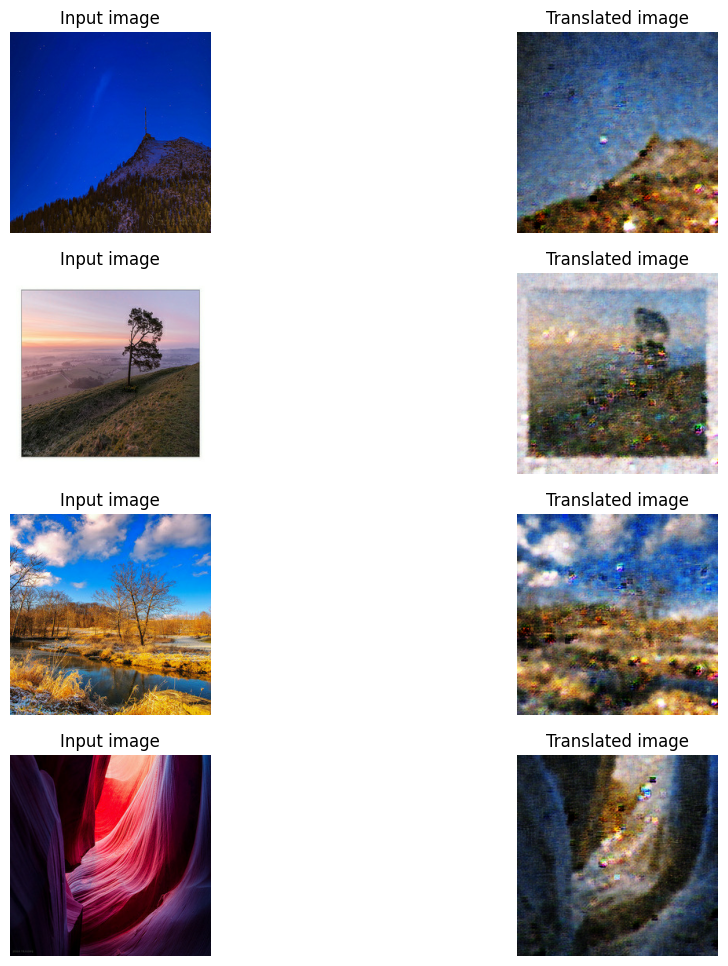

300/300 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - D_X_loss: 0.1990 - D_Y_loss: 0.1632 - F_loss: 2.9753 - G_loss: 3.4905
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - D_X_loss: 0.1943 - D_Y_loss: 0.1601 - F_loss: 2.9281 - G_loss: 3.3917

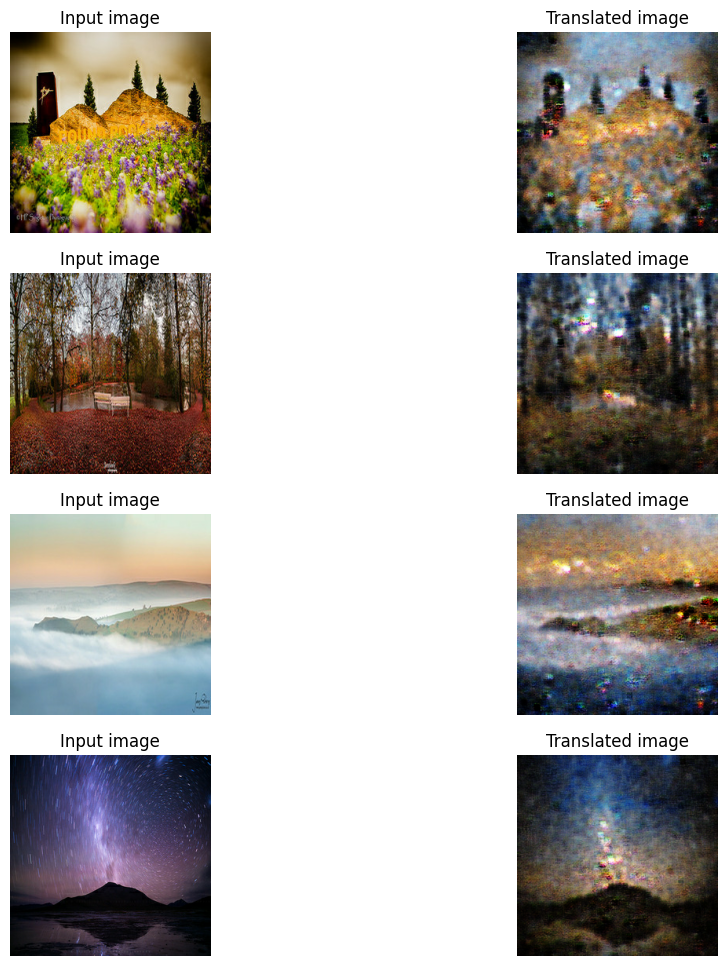

300/300 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - D_X_loss: 0.1942 - D_Y_loss: 0.1601 - F_loss: 2.9289 - G_loss: 3.3922
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - D_X_loss: 0.1926 - D_Y_loss: 0.1596 - F_loss: 2.9097 - G_loss: 3.3965

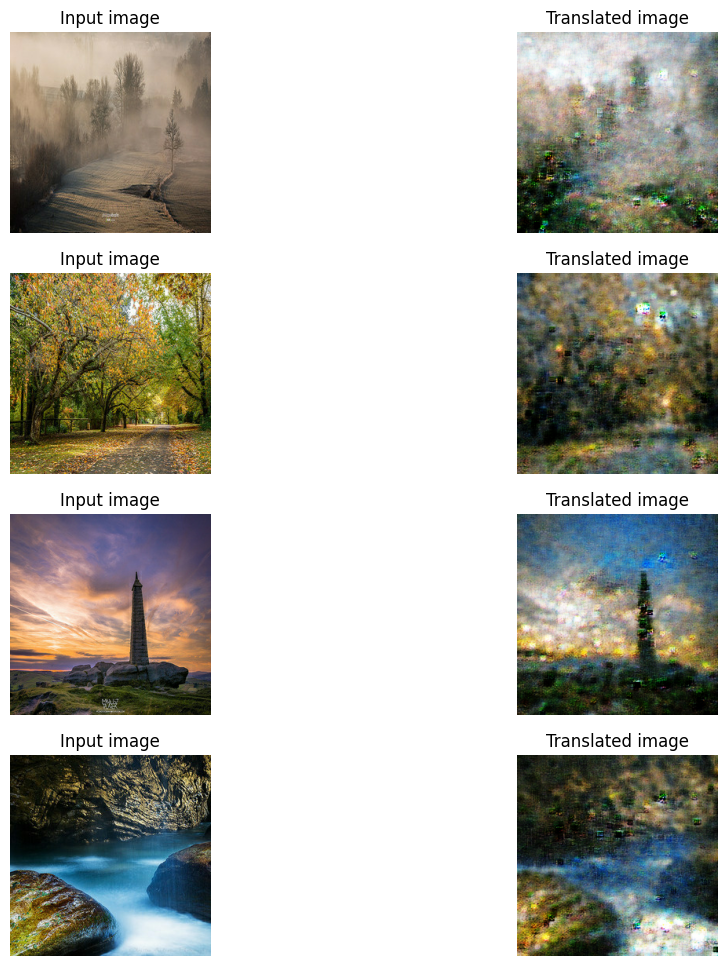

300/300 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - D_X_loss: 0.1925 - D_Y_loss: 0.1598 - F_loss: 2.9080 - G_loss: 3.3958
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - D_X_loss: 0.1831 - D_Y_loss: 0.1549 - F_loss: 2.8992 - G_loss: 3.3806

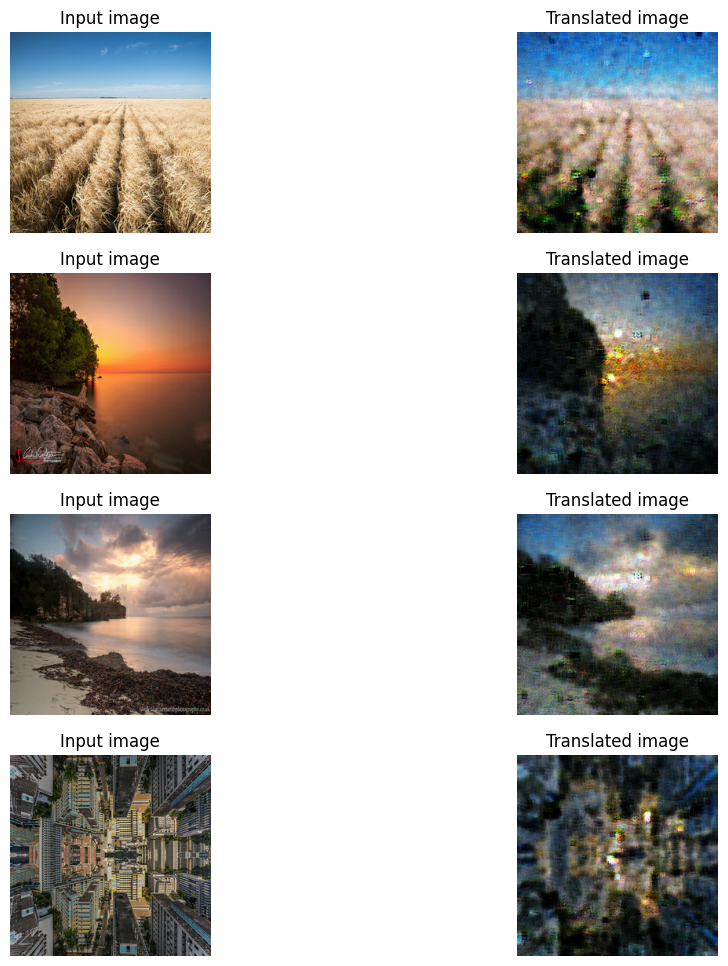

300/300 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - D_X_loss: 0.1831 - D_Y_loss: 0.1550 - F_loss: 2.8990 - G_loss: 3.3783


In [23]:
# Loss function for evaluating adversarial loss
adv_loss_fn = tf.keras.losses.MeanSquaredError()

# Define the loss function for the generators
def generator_loss_fn(fake):
    fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
    return fake_loss


# Define the loss function for the discriminators
def discriminator_loss_fn(real, fake):
    real_loss = adv_loss_fn(tf.ones_like(real), real)
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_G=monet_generator, generator_F=photo_generator, discriminator_X=monet_discriminator, discriminator_Y=photo_discriminator
)

# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=optimizers.Adam(2e-4, beta_1=0.5),
    gen_F_optimizer=optimizers.Adam(2e-4, beta_1=0.5),
    disc_X_optimizer=optimizers.Adam(2e-4, beta_1=0.5),
    disc_Y_optimizer=optimizers.Adam(2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()
os.makedirs("./content/drive/MyDrive/models", exist_ok=True)
checkpoint_filepath = "./content/drive/MyDrive/models/cyclegan_checkpoints.{epoch:03d}.keras"
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath, save_weights_only=False
)

# Here we will train the model for just one epoch as each epoch takes around
# 7 minutes on a single P100 backed machine.
model = cycle_gan_model.fit(
    tf.data.Dataset.zip((train_ds, test_ds)),
    epochs=10,
    callbacks=[plotter, model_checkpoint_callback],
)


## Conclusions
The results shown in the images above display the outputs from the CycleGAN model training trough the epochs.

Input Images:

On the left, "Input image" examples are shown, representing photo images from the dataset that are being transformed into the painting domain.

Translated Images:

On the right, corresponding "Translated images" are displayed. These images are the model’s generated outputs, attempting to translate the input images into the Monet domain.  
The translated images appear much more abstract, with visible artifacts and loss of fine details. This could suggest that the model is either early in training or struggling to generate high-quality outputs. The images show a "painterly" effect.

Final D_X_loss: 0.18 and D_Y_loss: 0.15 are the discriminator losses for the two domains. Lower losses indicate that the discriminators are learning to distinguish between real and fake images, but values this small may also indicate potential overfitting if the training continues for too long.
F_loss: 2.90 and G_loss: 3.37: These are the generator losses for the two transformations (photo-to-art and art-to-photo). The relatively higher values suggest that the generators are still learning to produce more realistic images.

The model seems to be making progress but is still far from generating photorealistic results. The current translation shows some patterns and colors, but the generated images remain noisy and low in detail.
These results could improve with further training, additional layers, tuning of hyperparameters, or adjustments to the loss function.

## Submission

In [24]:
import shutil
import PIL

i = 1
for photo in test_ds:
    prediction = monet_generator(photo, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    im = PIL.Image.fromarray(prediction)
    os.makedirs("../images", exist_ok=True)
    im.save("../images/" + str(i) + ".jpg")
    i += 1

shutil.make_archive("/kaggle/working/images", 'zip', "/kaggle/images")

'/kaggle/working/images.zip'